In [53]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from src.config import DADOS_ORIGINAIS, DADOS_LIMPOS
from src.graficos import SCATTER_ALPHA, PALETTE

In [2]:
df = pd.read_csv(DADOS_ORIGINAIS, compression="zip")
df.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


In [3]:
df.tail()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
20635,-121.09,39.48,25.0,1665.0,374.0,845.0,330.0,1.5603,78100.0,INLAND
20636,-121.21,39.49,18.0,697.0,150.0,356.0,114.0,2.5568,77100.0,INLAND
20637,-121.22,39.43,17.0,2254.0,485.0,1007.0,433.0,1.7000,92300.0,INLAND
20638,-121.32,39.43,18.0,1860.0,409.0,741.0,349.0,1.8672,84700.0,INLAND
20639,-121.24,39.37,16.0,2785.0,616.0,1387.0,530.0,2.3886,89400.0,INLAND


In [4]:
df.info()

<class 'pandas.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  str    
dtypes: float64(9), str(1)
memory usage: 1.7 MB


- Há alguma colunas que parecem conter apenas valores inteiros mas estão configurados como float na tabela.
- Há valores nulos na coluna total_bedrooms

In [5]:
df.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,20640.000000,20640.000000,20640.000000,20640.000000,20433.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,-119.569704,35.631861,28.639486,2635.763081,537.870553,1425.476744,499.539680,3.870671,206855.816909
std,2.003532,2.135952,12.585558,2181.615252,421.385070,1132.462122,382.329753,1.899822,115395.615874
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.800000,33.930000,18.000000,1447.750000,296.000000,787.000000,280.000000,2.563400,119600.000000
50%,-118.490000,34.260000,29.000000,2127.000000,435.000000,1166.000000,409.000000,3.534800,179700.000000
75%,-118.010000,37.710000,37.000000,3148.000000,647.000000,1725.000000,605.000000,4.743250,264725.000000
max,-114.310000,41.950000,52.000000,39320.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000


- As colunas total_rooms , total_bedrooms, population, households parece conter outliers
- Os valores maximos e minimos de renda e preço das casas contem valores que podem indicar um corte de faixa dos dados originais.

In [6]:
df.describe(exclude="number")

,ocean_proximity
count,20640
unique,5
top,<1H OCEAN
freq,9136


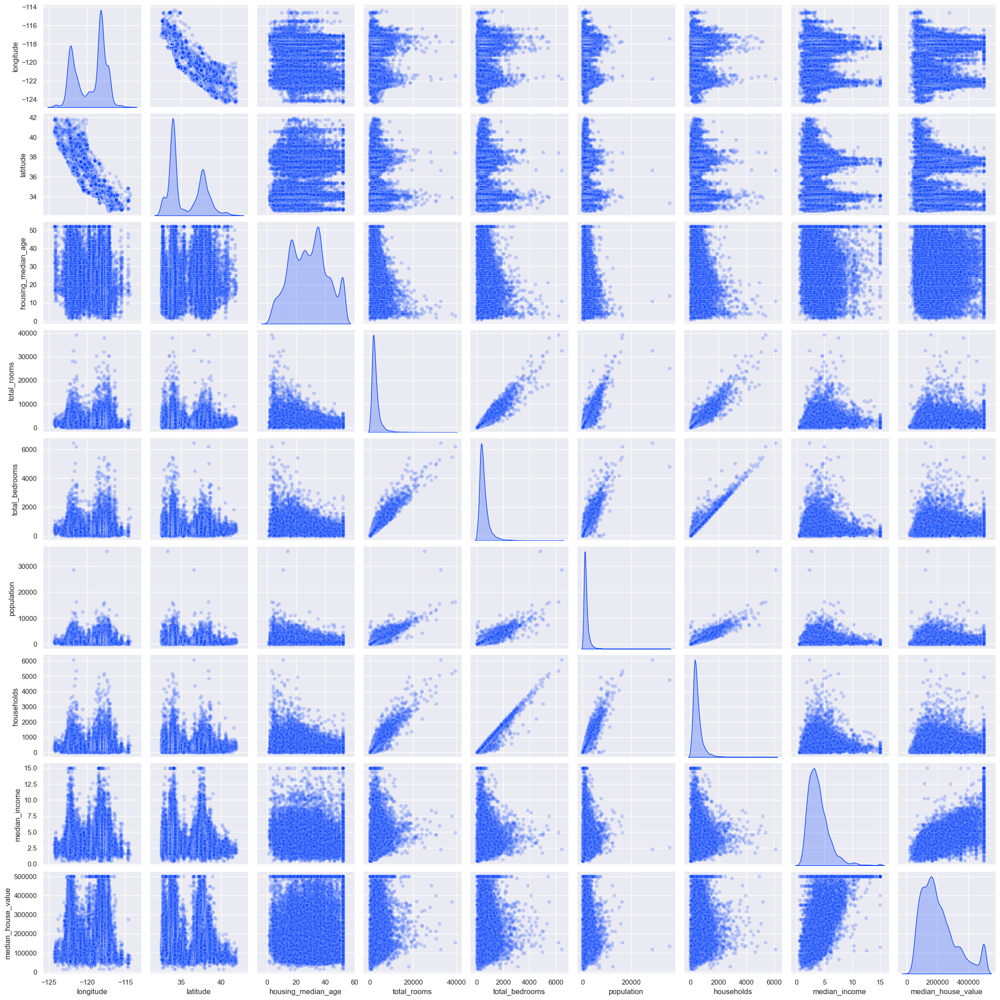

In [7]:
sns.pairplot(df, diag_kind="kde", plot_kws=dict(alpha=SCATTER_ALPHA))

- Os graficos de latidude e longitude formam o mapa do estado da california mostrando em tons mais fortes as regiões com maior densidade de casa.
    - os graficos da distribuição de latitude e longitude mostram os picos onde há maior densidade de casas

- Os graficos de distruibução de total_rooms , total_bedrooms, population, households são muito assimetricos, tem uma longa calda a direita, causada por possíveis outliers.
    - a distruição de median_income também mostra alguns outliers
 
- Há uma forte correlação entre Preço das casas e Renda dos moradores. Isso já era esperado.

- Os gráfico de idade, renda e preço mostram alguns valores alinhados no topo, que podem indicar um ajuste manual dos valores máximos dessas colunas.

In [8]:
df.select_dtypes("number").skew()

longitude            -0.297801
latitude              0.465953
housing_median_age    0.060331
total_rooms           4.147343
total_bedrooms        3.459546
population            4.935858
households            3.410438
median_income         1.646657
median_house_value    0.977763
dtype: float64

In [9]:
df.select_dtypes("number").kurtosis()

longitude             -1.330152
latitude              -1.117760
housing_median_age    -0.800629
total_rooms           32.630927
total_bedrooms        21.985575
population            73.553116
households            22.057988
median_income          4.952524
median_house_value     0.327870
dtype: float64

In [10]:
df[df.duplicated()] #Sem registros duplicados

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity


In [11]:
#Analisando valores nulo
df[df.isnull().any(axis=1)]

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
290,-122.16,37.77,47.0,1256.0,NaN,570.0,218.0,4.3750,161900.0,NEAR BAY
341,-122.17,37.75,38.0,992.0,NaN,732.0,259.0,1.6196,85100.0,NEAR BAY
538,-122.28,37.78,29.0,5154.0,NaN,3741.0,1273.0,2.5762,173400.0,NEAR BAY
563,-122.24,37.75,45.0,891.0,NaN,384.0,146.0,4.9489,247100.0,NEAR BAY
696,-122.10,37.69,41.0,746.0,NaN,387.0,161.0,3.9063,178400.0,NEAR BAY
...,...,...,...,...,...,...,...,...,...,...
20267,-119.19,34.20,18.0,3620.0,NaN,3171.0,779.0,3.3409,220500.0,NEAR OCEAN
20268,-119.18,34.19,19.0,2393.0,NaN,1938.0,762.0,1.6953,167400.0,NEAR OCEAN
20372,-118.88,34.17,15.0,4260.0,NaN,1701.0,669.0,5.1033,410700.0,<1H OCEAN
20460,-118.75,34.29,17.0,5512.0,NaN,2734.0,814.0,6.6073,258100.0,<1H OCEAN


In [12]:
df[df.isnull().any(axis=1)].describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,207.000000,207.000000,207.000000,207.000000,0.0,207.000000,207.000000,207.000000,207.000000
mean,-119.472560,35.497633,29.270531,2562.603865,NaN,1477.772947,510.024155,3.822244,206007.280193
std,2.001424,2.097298,11.964927,1787.269789,NaN,1057.448212,386.120704,1.955595,111638.214545
min,-124.130000,32.660000,4.000000,154.000000,NaN,37.000000,16.000000,0.852700,45800.000000
25%,-121.810000,33.970000,19.000000,1307.500000,NaN,781.000000,258.000000,2.564150,128750.000000
50%,-118.490000,34.200000,30.000000,2155.000000,NaN,1217.000000,427.000000,3.411500,175000.000000
75%,-117.985000,37.495000,38.000000,3465.000000,NaN,1889.500000,628.000000,4.615750,267700.000000
max,-114.590000,40.920000,52.000000,11709.000000,NaN,7604.000000,3589.000000,15.000100,500001.000000


Os valores vazio parecem ser aleatórios, pois não há um padrão encontrado nas linhas com valores vazios. Uma opção viável seria descartar essas linhas se houver necessidade.

In [13]:
df["ocean_proximity"].value_counts()

ocean_proximity
<1H OCEAN     9136
INLAND        6551
NEAR OCEAN    2658
NEAR BAY      2290
ISLAND           5
Name: count, dtype: int64

Categoria Island ("ilha") tem apenas 5 registros na base de dados e pode ser um problema para o modelo de Machine Learning. Tomaremos essas decisões após o fim da analise exploratória para não serem tomadas decisões precipitadas.

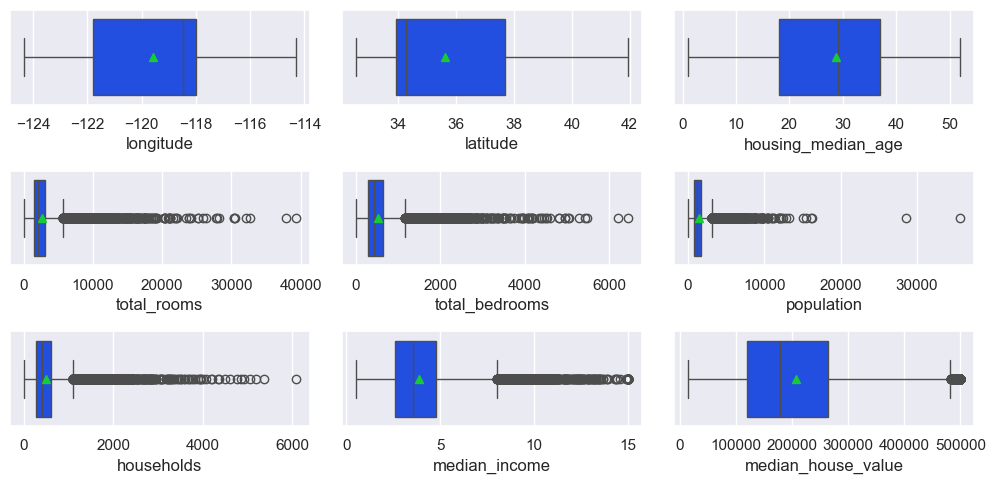

In [14]:
fig, axs = plt.subplots(3,3, figsize = (10,5))

for ax, coluna in zip(axs.flatten(), df.columns):
    sns.boxplot(data = df, x=coluna, showmeans=True, ax=ax)

plt.tight_layout()

plt.show()

- Com o boxplot podemos confirmar os outliers em algumas colunas da tabela. 
    - Os valores estão concentrados em valores pequenos mas há uma grande quantidade de outilers em valores muito grandes.

#### Qual a relação das colunas entre si e com a coluna target "median_house_value" (Preço mediano da casa)

<Axes: >

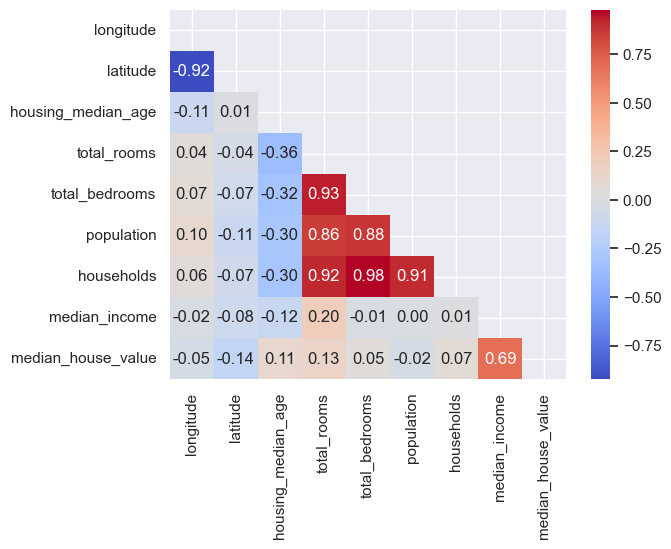

In [15]:
matriz = np.triu(df.select_dtypes("number").corr())
fig, ax = plt.subplots()

sns.heatmap(
    df.select_dtypes("number").corr(),
    mask=matriz,
    annot=True,
    fmt=".2f",
    ax=ax,
    cmap = PALETTE
)

- Nossa coluna target tem uma alta correlação apenas com um coluna (median_income)
- Existem três colunas que são fortemente correlacionadas. Essa redundância pode ser um problema para o modelo. Será que precisamos das 3 colunas ou podemos remover algumas delas? Uma também seria criar outras colunas derivada da cobinação dessas e outras colunas.
- Há uma relaçao negativa entre idade das casas e outras colunas (households, population, total_bedrroms, total_rooms). Vamos tentar descobrir o motivo.
    - Uma possível hipótese seria um grande aumento de construção de hoteis e resorts na região nos ultimos anos. 

Algumas variáveis novas:

- classes de `median_income`
- comodos por domicilio: Domicilios com mais comodos tendem a ser mais caros
- pessoas por domicilio: domicilios com mais pesoas tendem a ser hospedagens que são mais caras.
- quartos por cômodo: domicilios com essa relação alta tende a ser de hospedagens e baixas tendem a ser residenciais.
- pessoas por comodo: Mais pessoas indicam casas maiores ou hospedagens, ambas  tendem ser mais caras.

In [16]:
#criando classes de 'median_income'
df['median_income_cat'] = pd.cut(
   df['median_income'],
    bins = [0,1.5,3,4.5,6,np.inf],
    labels = [1,2,3,4,5]
)

df.info()

<class 'pandas.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   longitude           20640 non-null  float64 
 1   latitude            20640 non-null  float64 
 2   housing_median_age  20640 non-null  float64 
 3   total_rooms         20640 non-null  float64 
 4   total_bedrooms      20433 non-null  float64 
 5   population          20640 non-null  float64 
 6   households          20640 non-null  float64 
 7   median_income       20640 non-null  float64 
 8   median_house_value  20640 non-null  float64 
 9   ocean_proximity     20640 non-null  str     
 10  median_income_cat   20640 non-null  category
dtypes: category(1), float64(9), str(1)
memory usage: 1.8 MB


In [17]:
df['median_income_cat'].value_counts(sort=False)

median_income_cat
1     822
2    6581
3    7236
4    3639
5    2362
Name: count, dtype: int64

<Axes: xlabel='median_income_cat'>

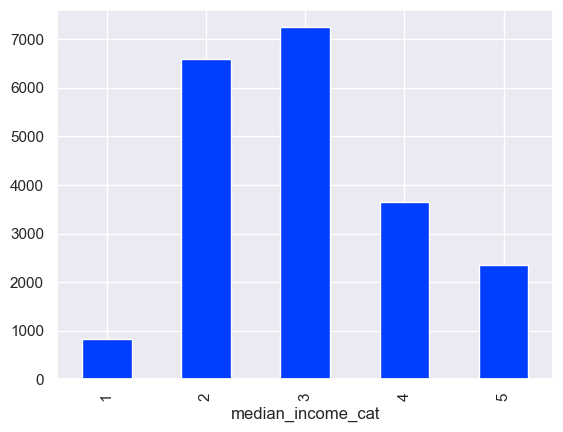

In [18]:
df['median_income_cat'].value_counts(sort=False).plot(kind='bar')

In [19]:
df.columns

Index(['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income',
       'median_house_value', 'ocean_proximity', 'median_income_cat'],
      dtype='str')

In [20]:
df['rooms_per_household'] = df['total_rooms'] / df['households'] # comodos por domicilio
df['population_per_household'] = df['population'] / df['households'] # pessoas por domicilio
df['bedrooms_per_room'] = df['total_bedrooms'] / df['total_rooms'] # quartos por cômodo
df['population_per_room'] = df['population'] / df['total_rooms'] # pessoas por comodo

df.info()

<class 'pandas.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 15 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   longitude                 20640 non-null  float64 
 1   latitude                  20640 non-null  float64 
 2   housing_median_age        20640 non-null  float64 
 3   total_rooms               20640 non-null  float64 
 4   total_bedrooms            20433 non-null  float64 
 5   population                20640 non-null  float64 
 6   households                20640 non-null  float64 
 7   median_income             20640 non-null  float64 
 8   median_house_value        20640 non-null  float64 
 9   ocean_proximity           20640 non-null  str     
 10  median_income_cat         20640 non-null  category
 11  rooms_per_household       20640 non-null  float64 
 12  population_per_household  20640 non-null  float64 
 13  bedrooms_per_room         20433 non-null  float64 
 14  p

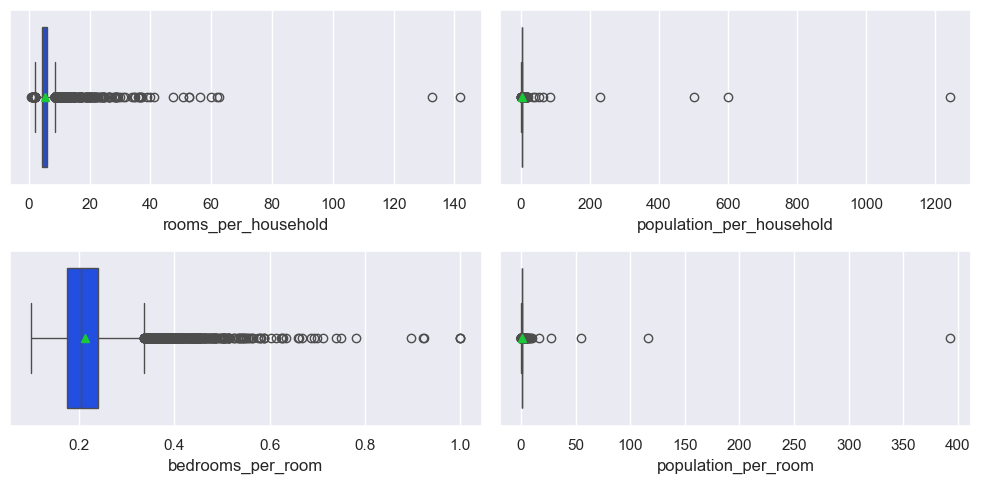

In [21]:
fig, axs = plt.subplots(2,2, figsize = (10,5))

for ax, coluna in zip(axs.flatten(), df.columns[11:15]):
    sns.boxplot(data = df, x=coluna, showmeans=True, ax=ax)

plt.tight_layout()

plt.show()

<Axes: >

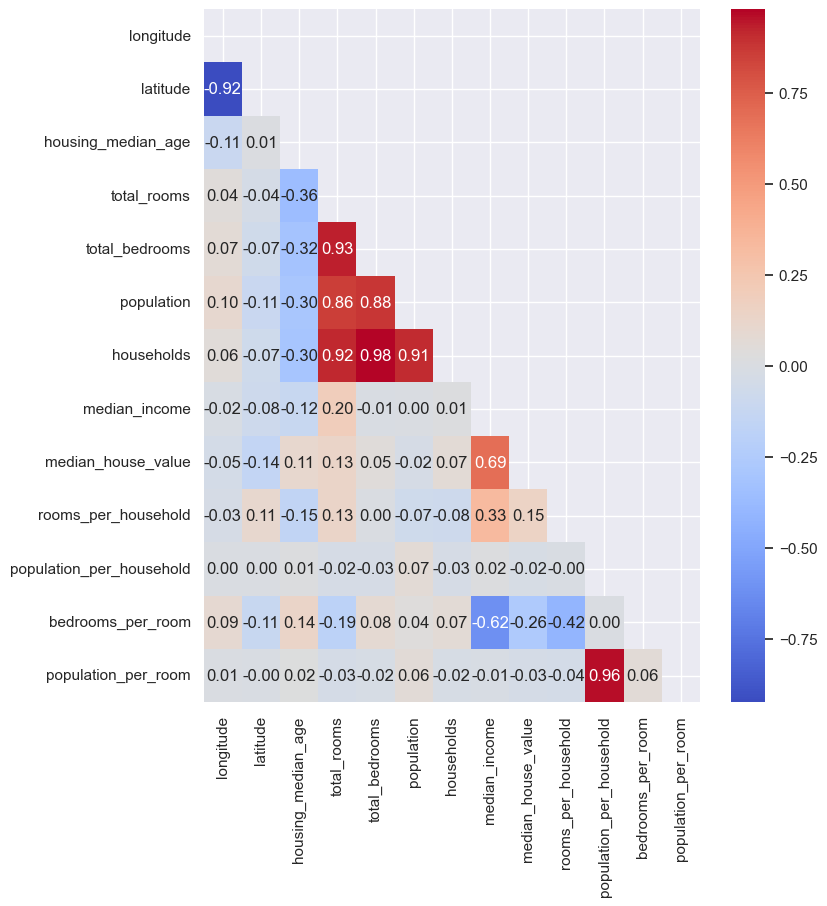

In [22]:
matriz = np.triu(df.select_dtypes("number").corr())
fig, ax = plt.subplots(figsize=(8,9))

sns.heatmap(
    df.select_dtypes("number").corr(),
    mask=matriz,
    annot=True,
    fmt=".2f",
    ax=ax,
    cmap = PALETTE
)

Após criação das nova variáveis, temos 2 variáveis com **alta correlação** com `median_house_value`: `rooms_per_household` e `bedrooms_per_room`.

E temos outras 2 com **correlação muito baixa**: `population_per_household` e `population_per_room`


#### Tratamento de Outliers

In [23]:

df[
    df['median_house_value'] == df['median_house_value'].max()
    ]

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,median_income_cat,rooms_per_household,population_per_household,bedrooms_per_room,population_per_room
89,-122.27,37.80,52.0,249.0,78.0,396.0,85.0,1.2434,500001.0,NEAR BAY,1,2.929412,4.658824,0.313253,1.590361
459,-122.25,37.87,52.0,609.0,236.0,1349.0,250.0,1.1696,500001.0,NEAR BAY,1,2.436000,5.396000,0.387521,2.215107
493,-122.24,37.86,52.0,1668.0,225.0,517.0,214.0,7.8521,500001.0,NEAR BAY,5,7.794393,2.415888,0.134892,0.309952
494,-122.24,37.85,52.0,3726.0,474.0,1366.0,496.0,9.3959,500001.0,NEAR BAY,5,7.512097,2.754032,0.127214,0.366613
509,-122.23,37.83,52.0,2990.0,379.0,947.0,361.0,7.8772,500001.0,NEAR BAY,5,8.282548,2.623269,0.126756,0.316722
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20422,-118.90,34.14,35.0,1503.0,263.0,576.0,216.0,5.1457,500001.0,<1H OCEAN,4,6.958333,2.666667,0.174983,0.383234
20426,-118.69,34.18,11.0,1177.0,138.0,415.0,119.0,10.0472,500001.0,<1H OCEAN,5,9.890756,3.487395,0.117247,0.352591
20427,-118.80,34.19,4.0,15572.0,2222.0,5495.0,2152.0,8.6499,500001.0,<1H OCEAN,5,7.236059,2.553439,0.142692,0.352877
20436,-118.69,34.21,10.0,3663.0,409.0,1179.0,371.0,12.5420,500001.0,<1H OCEAN,5,9.873315,3.177898,0.111657,0.321867


In [24]:
965/df.shape[0]*100

4.675387596899225

In [25]:
df['median_house_value'].quantile(0.99)

np.float64(500001.0)

In [26]:
df['median_house_value'].quantile(0.96)

np.float64(500001.0)

In [27]:
df['housing_median_age'].quantile(0.90)

np.float64(46.0)

Colunas com muito valores no máximo, formando uma linha, conforme visto no histograma, com tendência de algum ajuste manual:
- housing_median_age
- median_house_value
- median_income

In [28]:
df_clean = df.copy()

In [29]:
#Manter na tabela apenas as linhas com quantile menor que 99
QUANTIL = 0.99
df_clean = df_clean[
    (df['housing_median_age'] < df['housing_median_age'].quantile(QUANTIL))
    & (df['total_rooms'] < df['total_rooms'].quantile(QUANTIL))
    & (df['total_bedrooms'] < df['total_bedrooms'].quantile(QUANTIL))
    & (df['population'] < df['population'].quantile(QUANTIL))
    & (df['households'] < df['households'].quantile(QUANTIL))
    & (df['median_income'] < df['median_income'].quantile(QUANTIL))
    & (df['median_house_value'] < df['median_house_value'].quantile(QUANTIL))
    & (df['rooms_per_household'] < df['rooms_per_household'].quantile(QUANTIL))
    & (df['population_per_household'] < df['population_per_household'].quantile(QUANTIL))
    & (df['bedrooms_per_room'] < df['bedrooms_per_room'].quantile(QUANTIL))
    & (df['population_per_room'] < df['population_per_room'].quantile(QUANTIL))
    
]
df_clean.info()

<class 'pandas.DataFrame'>
Index: 17517 entries, 0 to 20639
Data columns (total 15 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   longitude                 17517 non-null  float64 
 1   latitude                  17517 non-null  float64 
 2   housing_median_age        17517 non-null  float64 
 3   total_rooms               17517 non-null  float64 
 4   total_bedrooms            17517 non-null  float64 
 5   population                17517 non-null  float64 
 6   households                17517 non-null  float64 
 7   median_income             17517 non-null  float64 
 8   median_house_value        17517 non-null  float64 
 9   ocean_proximity           17517 non-null  str     
 10  median_income_cat         17517 non-null  category
 11  rooms_per_household       17517 non-null  float64 
 12  population_per_household  17517 non-null  float64 
 13  bedrooms_per_room         17517 non-null  float64 
 14  popula

In [30]:
1- df_clean.shape[0]/df.shape[0]

0.15130813953488376

In [31]:
df_clean.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,rooms_per_household,population_per_household,bedrooms_per_room,population_per_room
count,17517.000000,17517.000000,17517.000000,17517.000000,17517.000000,17517.000000,17517.000000,17517.000000,17517.000000,17517.000000,17517.000000,17517.000000,17517.000000
mean,-119.513146,35.605988,27.266199,2514.745847,515.889593,1385.718217,484.380659,3.700305,189708.505909,5.260679,2.929773,0.211296,0.584592
std,1.985313,2.148388,11.323866,1593.690628,320.936653,844.288271,295.656483,1.541788,96055.068798,1.128134,0.685901,0.047849,0.206786
min,-124.300000,32.540000,1.000000,6.000000,2.000000,3.000000,2.000000,0.499900,14999.000000,1.714286,0.750000,0.113535,0.166667
25%,-121.600000,33.920000,18.000000,1468.000000,300.000000,816.000000,287.000000,2.552300,114300.000000,4.455782,2.469274,0.176862,0.447895
50%,-118.470000,34.250000,28.000000,2135.000000,438.000000,1195.000000,415.000000,3.483700,171700.000000,5.210412,2.850267,0.203352,0.523885
75%,-117.980000,37.680000,36.000000,3128.000000,643.000000,1737.000000,605.000000,4.625000,244000.000000,5.963675,3.301587,0.238626,0.659735
max,-114.550000,41.950000,51.000000,11026.000000,2205.000000,5804.000000,1979.000000,10.594100,500000.000000,10.352941,5.392384,0.406295,1.529833


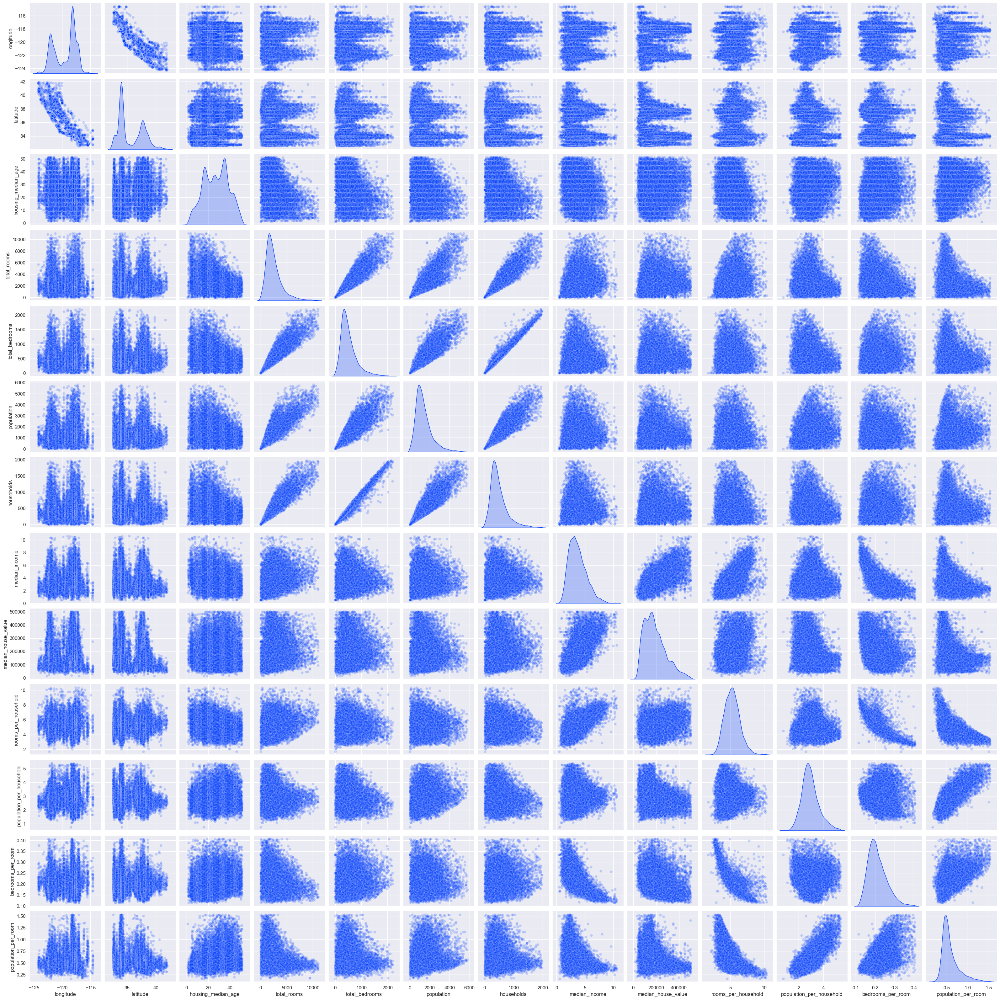

In [32]:
sns.pairplot(df_clean, diag_kind="kde", plot_kws=dict(alpha=SCATTER_ALPHA))

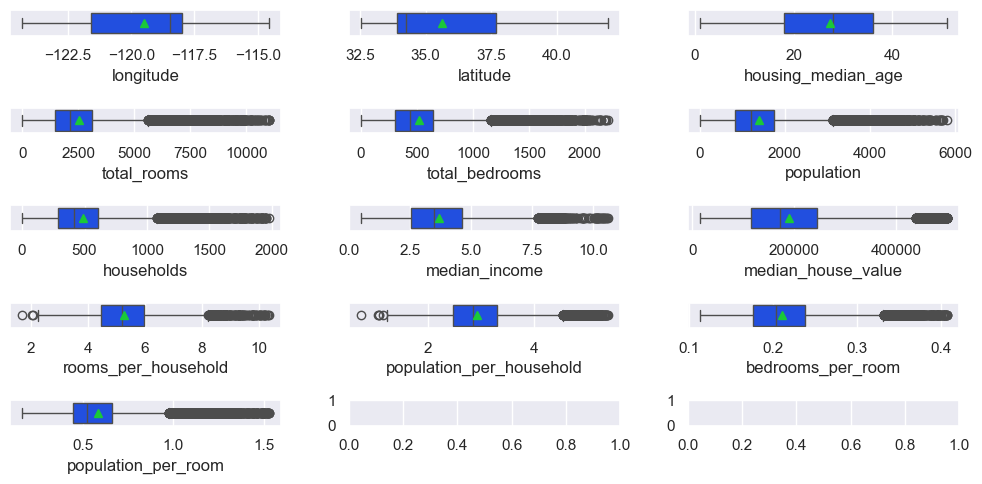

In [33]:
fig, axs = plt.subplots(5,3, figsize = (10,5))

for ax, coluna in zip(axs.flatten(), df.select_dtypes("number").columns):
    sns.boxplot(data = df_clean, x=coluna, showmeans=True, ax=ax)

plt.tight_layout()

plt.show()

In [34]:
df.select_dtypes("number").shape

(20640, 13)

<Axes: >

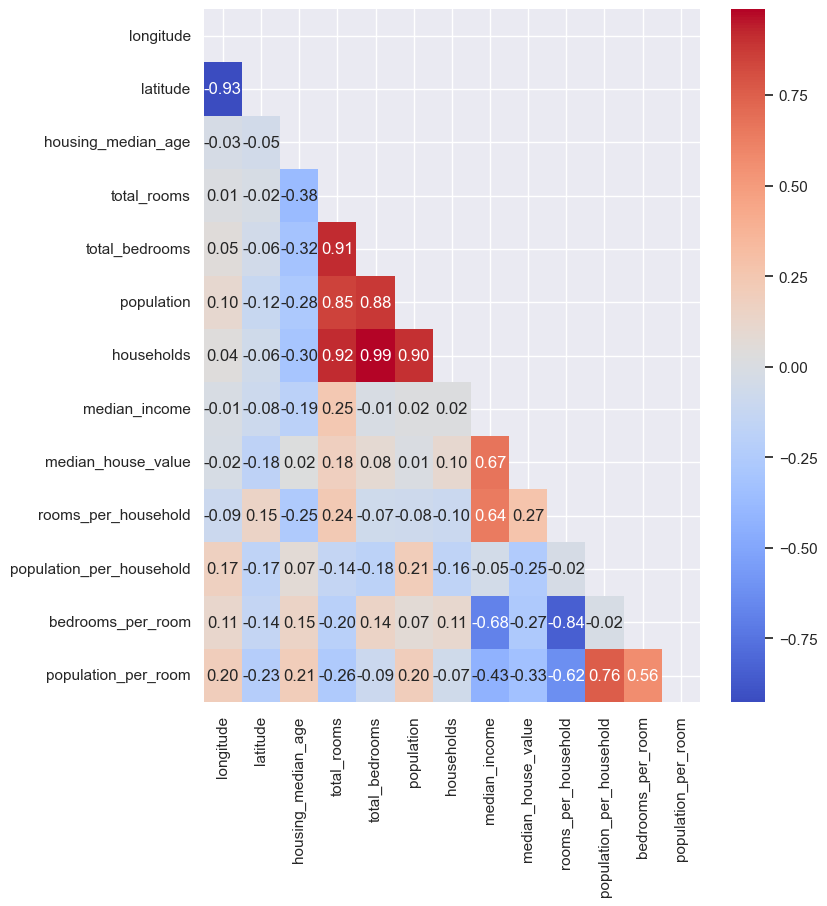

In [35]:
matriz = np.triu(df.select_dtypes("number").corr())
fig, ax = plt.subplots(figsize=(8,9))

sns.heatmap(
    df_clean.select_dtypes("number").corr(),
    mask=matriz,
    annot=True,
    fmt=".2f",
    ax=ax,
    cmap = PALETTE
)

Com a **retirada de alguns outliers**, já temos **aumento nas correlações** de algumas variáveis com o valor das casas.
- 'rooms_per_household': aumentou positivamente de 0.15 para 0.27
- 'population_per_household': aumentou negativamente de -0.02 para -0.25
- 'population_per_room': aumentou negativamente de -0.03 para -0.33

In [38]:
df_clean['ocean_proximity'].value_counts()

ocean_proximity
<1H OCEAN     7848
INLAND        5932
NEAR OCEAN    2219
NEAR BAY      1516
ISLAND           2
Name: count, dtype: int64

o tipo `ISLAND` só tem 2 linhas de informação e não será útil para nosso modelo de Machine Learning. Vamos **deletar** essas linhas do nosso Data Frame.

In [44]:
df_clean = df_clean.loc[df_clean['ocean_proximity'] != 'ISLAND']
df_clean['ocean_proximity'].value_counts()

ocean_proximity
<1H OCEAN     7848
INLAND        5932
NEAR OCEAN    2219
NEAR BAY      1516
Name: count, dtype: int64

In [45]:
df_clean['ocean_proximity'] = df_clean['ocean_proximity'].astype("category") #tranformando em tipo categórica

In [46]:
df_clean.info()

<class 'pandas.DataFrame'>
Index: 17515 entries, 0 to 20639
Data columns (total 15 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   longitude                 17515 non-null  float64 
 1   latitude                  17515 non-null  float64 
 2   housing_median_age        17515 non-null  float64 
 3   total_rooms               17515 non-null  float64 
 4   total_bedrooms            17515 non-null  float64 
 5   population                17515 non-null  float64 
 6   households                17515 non-null  float64 
 7   median_income             17515 non-null  float64 
 8   median_house_value        17515 non-null  float64 
 9   ocean_proximity           17515 non-null  category
 10  median_income_cat         17515 non-null  category
 11  rooms_per_household       17515 non-null  float64 
 12  population_per_household  17515 non-null  float64 
 13  bedrooms_per_room         17515 non-null  float64 
 14  popula

In [47]:
#pegar as colunas com valores inteiros para tranformar o tipo de coluna float para int

colunas_valores_inteiros = []

for coluna in df_clean.select_dtypes("number"):
    if df_clean[coluna].apply(float.is_integer).all():
        colunas_valores_inteiros.append(coluna)

colunas_valores_inteiros

['housing_median_age',
 'total_rooms',
 'total_bedrooms',
 'population',
 'households',
 'median_house_value']

In [51]:
#transformando coluna float em inteiro para as colunas selecionadas
df_clean[colunas_valores_inteiros] = df_clean[colunas_valores_inteiros].apply(
    pd.to_numeric, downcast='integer')

df_clean.info()

<class 'pandas.DataFrame'>
Index: 17515 entries, 0 to 20639
Data columns (total 15 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   longitude                 17515 non-null  float64 
 1   latitude                  17515 non-null  float64 
 2   housing_median_age        17515 non-null  int8    
 3   total_rooms               17515 non-null  int16   
 4   total_bedrooms            17515 non-null  int16   
 5   population                17515 non-null  int16   
 6   households                17515 non-null  int16   
 7   median_income             17515 non-null  float64 
 8   median_house_value        17515 non-null  int32   
 9   ocean_proximity           17515 non-null  category
 10  median_income_cat         17515 non-null  category
 11  rooms_per_household       17515 non-null  float64 
 12  population_per_household  17515 non-null  float64 
 13  bedrooms_per_room         17515 non-null  float64 
 14  popula

In [52]:
#verificando se houve mudanças nos valores após transformação para inteiro
df_clean.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,rooms_per_household,population_per_household,bedrooms_per_room,population_per_room
count,17515.000000,17515.000000,17515.000000,17515.000000,17515.000000,17515.000000,17515.000000,17515.000000,17515.000000,17515.000000,17515.000000,17515.000000,17515.000000
mean,-119.513273,35.606241,27.266115,2514.896489,515.906537,1385.809877,484.407194,3.700456,189688.061547,5.260755,2.929839,0.211285,0.584600
std,1.985391,2.148380,11.324505,1593.711025,320.946868,844.291144,295.661729,1.541810,96037.570708,1.128166,0.685911,0.047841,0.206795
min,-124.300000,32.540000,1.000000,6.000000,2.000000,3.000000,2.000000,0.499900,14999.000000,1.714286,0.750000,0.113535,0.166667
25%,-121.605000,33.920000,18.000000,1468.000000,300.000000,816.000000,287.000000,2.552300,114300.000000,4.455787,2.469410,0.176860,0.447914
50%,-118.470000,34.250000,28.000000,2136.000000,438.000000,1195.000000,415.000000,3.483800,171700.000000,5.210526,2.850365,0.203350,0.523885
75%,-117.980000,37.680000,36.000000,3128.000000,643.000000,1737.000000,605.000000,4.625000,243900.000000,5.963796,3.301620,0.238610,0.659836
max,-114.550000,41.950000,51.000000,11026.000000,2205.000000,5804.000000,1979.000000,10.594100,500000.000000,10.352941,5.392384,0.406295,1.529833


In [ ]:
df_clean.to_parquet(DADOS_LIMPOS)